# Data Quality control for high content screenings before EM


  _This Jupyter Notebook belongs to the article : **CLEMSite, a software for automated phenotypic screens using light microscopy and FIB-SEM.** Please, cite the original paper if you make use of anything present in this notebook._

Images are from Hela Kyoto cells tagged with GFP on GalNAc-T2, fluorescent Golgi apparatus on green channel. DAPI staining of nuclei is on blue channel. Cells were transfected with siRNA COPB1 48 hours before imaging. Cells were seeded on 2 ml MatTek dishes in a concentration of 70.000 cells/ml. Cells were imaged using a Leica Confocal SP5.

It is divided into 4 sections :

1) **Data Loading and preprocessing** : Data is loaded using the loadData function and quality controls are applied on the images.

2) **Plot images**: Random images of the full assay are shown. General features are plotted.

3) **Select cells based on features, PCA or tSNE**: Selection of images (Which images where selected to be acquired by EM?) with corresponding names and a folder with individual crops. This can be done by plotting a feature or by other clustering technique like PCA or tSNE

4) **Validate selected cells and save them in a file**

## PART 1 : Data loading and preprocessing

Data for each experiment is saved as the data followed by the suffix “\_automation”. For each experiment data
is stored in two separate folders, one containing all the images of the screening from the selected
cells, and other with suffix “--cp” containing all the images from the pre-scanning of the spots with
additional files containing comma separated values with information about the images.

**Inside the _--cp_ folder**. Image features and metadata is extracted using a CellProfiler Pipeline v 2.2 (in the same folder). The CellProfiler pipeline first segmented the cells and then it extracted features from each identified Golgi region in the green channel. Cell position was identified from the nucleus associated to each cell. The _loadData_ function searches for a folder with "--cp" and looks for the files generated by the pipeline. Information is merged in a unique dataframe that will be used in the notebook as a source of data, a table structure where each column represent a feature and each row a cell found in the images.


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
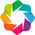

524it [00:09, 57.47it/s]

-- DATA on C:\Users\serra\Desktop\CLEMSite Paper\Latest\clemsite-notebooks\6_feedback_light_microscopy_one_phenotype\one_phenotype\data LOADED --


In [1]:
%load_ext autoreload
%autoreload 2
from validation_pipeline import *

# Folder where the automation data is. The folder should look something like date+_automation
#     - It will merge together all the data tables from Cell Profiler. Be sure that your output folder has the name --cp
#     - It will also generate crops of every cell ready for the plots. 
df = loadData(no_treatments=True, regenerate_crops = True, subfolder ='data')

In [9]:
import pandas as pd
import numpy as np
from validation_pipeline import plotQC, applyQC
from bokeh.io import output_notebook
output_notebook()

Loading BokehJS ...

In [3]:
## START HERE IF YOU WANT TO REPEAT THE CONTROLS
df_qc = df.copy()

In [4]:
df.head()

,Metadata_BaseFileName,FileName_ColorImage,Location_Center_X,Location_Center_Y,Mean_Golgi_AreaShape_Center_X,Mean_Golgi_AreaShape_Center_Y,Mean_Nuclei_AreaShape_Solidity,Metadata_U,Metadata_V,Metadata_X,...,ImageQuality_PowerLogLogSlope_Dna,Intensity_IntegratedIntensity_GolgiBGCorr,Mean_Nuclei_Math_CV,Math_Blobness,Math_Diffuseness,Children_Golgi_Count,Mean_MaxAreaGolgi_AreaShape_FormFactor,Gene,img_name,img_name_raw
0,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,625.973978,343.800743,620.00,338.5,0.960759,0,0,0,...,-2.077484,293.550841,0.238129,0.847078,0.692007,2,0.686566,UMO,C:\Users\serra\Desktop\CLEMSite Paper\Latest\c...,./crops/image--L0000--S00--U00--V00--J07--E00-...
1,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,33.200577,125.072413,54.50,112.0,0.957352,0,0,0,...,-1.700897,149.563642,0.411079,0.859343,0.697376,2,0.484985,UMO,C:\Users\serra\Desktop\CLEMSite Paper\Latest\c...,./crops/image--L0000--S00--U00--V00--J07--E00-...
2,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,144.068660,198.732614,141.00,197.0,0.960563,0,0,0,...,-1.700897,261.350214,0.804955,0.630102,0.766983,2,0.660132,UMO,C:\Users\serra\Desktop\CLEMSite Paper\Latest\c...,./crops/image--L0000--S00--U00--V00--J07--E00-...
3,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,63.408124,213.611495,59.25,222.5,0.959281,0,0,0,...,-1.700897,249.222059,0.538432,0.781248,0.707491,4,0.673044,UMO,C:\Users\serra\Desktop\CLEMSite Paper\Latest\c...,./crops/image--L0000--S00--U00--V00--J07--E00-...
4,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,424.276363,318.223383,426.50,296.5,0.959415,0,0,0,...,-1.700897,185.264183,0.194579,0.642687,0.740149,2,0.632589,UMO,C:\Users\serra\Desktop\CLEMSite Paper\Latest\c...,./crops/image--L0000--S00--U00--V00--J07--E00-...


In [10]:
import os
from ipywidgets import widgets, HBox,Label,Button
%gui qt

get_ipython().enable_gui("qt")

bs = Button( description='Show selected',tooltip='Show in viewer',)

In [6]:
dfolder = "\""+ str(os.path.join(os.getcwd(),'data'))+"\""

In [ ]:
## I had to do this to reread cells and add Golgi center
#data_folder = os.getcwd()
#ndf = pd.read_csv(data_folder+"\\selected_cells.csv")
#final_df = pd.DataFrame()
#for i in ndf.index :
#    selection = df.loc[df['Location_Center_X'].astype(int)==int(ndf.at[i,'Location_Center_X'])]
#    selection = selection.loc[selection['Location_Center_Y'].astype(int)==int(ndf.at[i,'Location_Center_Y'])]
#    final_df = pd.concat([final_df,selection],ignore_index=True)

In [ ]:
#final_df.to_csv('n_selected_cells.csv')

### QUALITY CONTROL 1 : QUALITY OF FOCUS
### Select the lowest number where you still can see a Golgi in focus. (-2.2 to inf)

- **PowerLogLogSlope of DNA**- Removing cells out of focus. Based on metrics from *_M.-A. Bray, A. N. Fraser, T. P. Hasaka, and A. E. Carpenter, “Workflow and Metrics for Image Quality Control in Large-Scale High-Content Screens,” J. Biomol. Screen., vol. 17, no. 2, pp. 266–274, Feb. 2012._*, this feature present on CellProfiler removes potential out of focus cells.  http://cellprofiler.org/manuals/current/MeasureImageQuality.html

Values are  between -2.2 to 100. A common value is -2.2. Values below -2.2 are removed.

In [12]:
mplot, selection_stream = plotQC(df_qc, "ImageQuality_PowerLogLogSlope_Dna","Focus_Quality", size = 8)

def openVisor(bval):
    images_list = [ df_qc.at[i,'img_name_raw'] for i in selection_stream.index]
    images_values = [ str(df_qc.at[i,'ImageQuality_PowerLogLogSlope_Dna']) for i in selection_stream.index]
    if len(images_list)>0:
        %run -i visorOk.py --listImages $images_list --folder $dfolder --listIndex $selection_stream.index --listValues $images_values

bs.on_click(openVisor)
display(widgets.HBox([bs]))
mplot

:Layout
   .Scatter.I    :Scatter   [Gene]   (ImageQuality_PowerLogLogSlope_Dna)
   .DynamicMap.I :DynamicMap   []
      :Div

#### TYPE DOWN HERE YOUR RESULT for FOCUS QUALITY:

In [7]:
### WRITE HERE
from ipywidgets import widgets, HBox,Label
### TYPE DOWN HERE YOUR RESULT for detecting artifacts or apoptosis:
# displaying the text widget
qc_focus_quality = widgets.FloatText(width=300)
hb = HBox([Label('Insert here value for Focus quality:'),qc_focus_quality])
display(hb)

def handle_submit_1(sender):
    print("You selected the value :"+str(qc_focus_quality.value))  
    return

qc_focus_quality.observe(handle_submit_1,'value')

You selected the value :-2.3


In [8]:
df_qc = applyQC(df_qc, "ImageQuality_PowerLogLogSlope_Dna",vmin= qc_focus_quality.value, vmax = -1.2)


QC for ImageQuality_PowerLogLogSlope_Dna
Values applied :[-2.3,-1.2].
Original number of cells:524
After applying control ImageQuality_PowerLogLogSlope_Dna :524
---QC ImageQuality_PowerLogLogSlope_Dna done.


### QUALITY CONTROL 2 : Nuclei coefficient of variation
### Select the highest value where you still can see a cell which is not apoptotic, mitotic cell or an artifact. (0-0.4)

**Mean Nuclei CV** – Coefficient of variation of the intensity. Usually is around 0.4 as maximum. Cells that have more than value are removed.

In [9]:
mplot, selection_stream = plotQC(df_qc, "Mean_Nuclei_Math_CV","Nuclei_Variation")
display(widgets.HBox([bs]))
mplot

:Layout
   .Scatter.I    :Scatter   [Gene]   (Mean_Nuclei_Math_CV)
   .DynamicMap.I :DynamicMap   []
      :Div

Show :
["['-1.7008966988799998',", "'-1.8760627259',", "'-1.47635430627',", "'-1.45400207817',", "'-1.63224306428',", "'-1.3821578775999999',", "'-1.50301370474',", "'-1.5381539080700002',", "'-1.51327383364',", "'-1.6467886305500001',", "'-1.40236079928']"]
- 9 : /crops/image--L0000--S00--U00--V00--J07--E00--O01--X00--Y02--T0000--Z00--colorImage_9.png
- 374 : /crops/image--L0000--S00--U00--V00--J07--E00--O01--X03--Y01--T0000--Z00--colorImage_374.png
- 314 : /crops/image--L0000--S00--U00--V00--J07--E00--O01--X02--Y18--T0000--Z00--colorImage_314.png
- 448 : /crops/image--L0000--S00--U00--V00--J07--E00--O01--X03--Y14--T0000--Z00--colorImage_448.png
- 503 : /crops/image--L0000--S00--U00--V00--J07--E00--O01--X03--Y26--T0000--Z00--colorImage_503.png
- 195 : /crops/image--L0000--S00--U00--V00--J07--E00--O01--X01--Y15--T0000--Z00--colorImage_195.png
- 218 : /crops/image--L0000--S00--U00--V00--J07--E00--O01--X01--Y20--T0000--Z00--colorImage_218.png
- 287 : /crops/image--L0000--S00--U00--V00--J

In [10]:
### WRITE HERE
from ipywidgets import widgets, HBox,Label
### TYPE DOWN HERE YOUR RESULT for detecting artifacts or apoptosis:
# displaying the text widget
qc_apo = widgets.FloatText(width=300)
hb = HBox([Label('Insert here value to remove apoptotic shapes:'),qc_apo])
display(hb)
def handle_submit_2(sender):
    print("You selected the value :"+str(qc_apo.value))   
    return

qc_apo.observe(handle_submit_2,'value')

You selected the value :0.58


In [11]:
if qc_apo.value: 
    df_qc = applyQC(df_qc, "Mean_Nuclei_Math_CV",vmax= float(qc_apo.value))

QC for Mean_Nuclei_Math_CV
Values applied :[-inf,0.58].
Original number of cells:524
After applying control Mean_Nuclei_Math_CV :483
---QC Mean_Nuclei_Math_CV done.


### QUALITY CONTROL 3 : REMOVE cells with dimmest signal
### Select the lowest value where you still can see a Golgi (30, inf) 

**Potential Mitotic cells**-  Integrated Intensity of Golgi background. Images which correlation values with the background are very close are removed. Range allowed was anything bigger than 30.

In [12]:
plotqc,selection_stream = plotQC(df_qc, "Intensity_IntegratedIntensity_GolgiBGCorr","Background_intensity")
display(widgets.HBox([bs]))
plotqc


:Layout
   .Scatter.I    :Scatter   [Gene]   (Intensity_IntegratedIntensity_GolgiBGCorr)
   .DynamicMap.I :DynamicMap   []
      :Div

In [13]:
### TYPE DOWN HERE YOUR RESULT for remove low background cells:
### WRITE HERE
from ipywidgets import widgets, HBox,Label
qc_bg = widgets.FloatText(width=300)
hb = HBox([Label('Insert here value for low intensity cells:'),qc_bg])
display(hb)
def handle_submit(sender):
    print("You selected the value :"+str(qc_bg.value))   
    return

qc_bg.observe(handle_submit,'value')

You selected the value :1.0
You selected the value :0.0


In [14]:
# Allowed range: 30 .. 1e+09 and not NA.
df_qc = applyQC(df_qc, "Intensity_IntegratedIntensity_GolgiBGCorr",vmin= qc_bg.value, vmax = 500)


QC for Intensity_IntegratedIntensity_GolgiBGCorr
Values applied :[0.0,500].
Original number of cells:483
After applying control Intensity_IntegratedIntensity_GolgiBGCorr :470
---QC Intensity_IntegratedIntensity_GolgiBGCorr done.


### END CONTROLS

In [15]:
#APPLY CONTROLS
df = df_qc
print(len(df))

470


----------------

# PART 2 : Plot images

In [16]:
%reload_ext autoreload
%autoreload 2
import cv2
import re
from validation_pipeline import findImagesGene
from matplotlib import pyplot as plt

import random
import os

def plot_images(df,how_many = 1):
    # For this we have to provide the folder where the data of the prescan is. 
    data_folder = os.getcwd()
    cp_dir = glob.glob(data_folder + "\\*--cp*")[0]
    images_dir = cp_dir + "\\images"
    df = df.reset_index(drop=True)
    samp = random.sample(range(len(df)), how_many)
    total = int(len(samp)/2)+1
    fig = plt.figure(figsize=(20,25))       
    k = 0
    for i in samp:
        mfile = images_dir+'\\'+df.at[i,"FileName_ColorImage"]
        img = cv2.imread(mfile)
        b,g,r = cv2.split(img)       # get b,g,r
        rgb_img = cv2.merge([r,g,b])
        if img is not None:           
                ax = fig.add_subplot(total, 2, k + 1, xticks=[], yticks=[])
                ax.imshow(np.squeeze(rgb_img))
                k = k+1

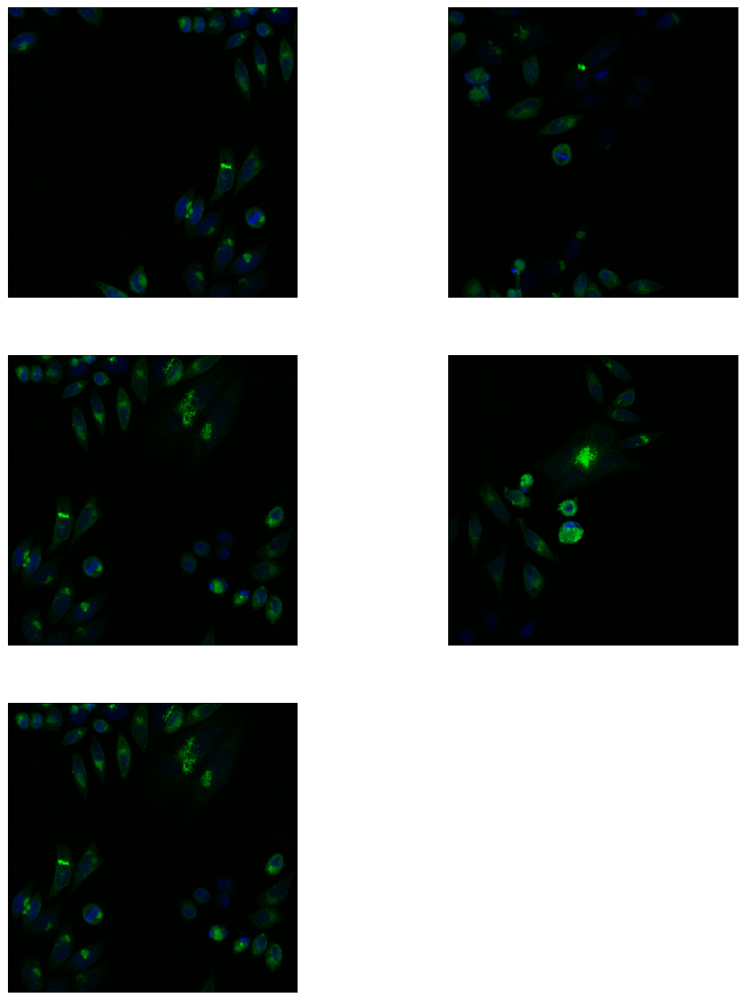

In [17]:
plot_images(df,5)

#### PLOT FEATURES
There is a total of 4 features : tubularity, diffusivity, fragmentation and condensation. The idea is that phenotypes show always one extreme difference on one of the features or a mixture of two of them, enough to be differentiated between phenotypes.

From the original data coming from a CellProfiler Pipeline, Blobness corresponds to tubularity, Diffusseness to diffusivity, Children_Golgi_Count to Fragmentation and Mean_MaxAreaGolgi_AreaShape_FormFactor to condensation. 


In [18]:
%reload_ext autoreload
%autoreload 2
#from validation_pipeline import getZscoreAgainstControl
# RENAME of Features and data conditioning needed is done here

# This prepares the data for feature inspection with nicer names
df.loc[:,'Children_Golgi_Count']=df.loc[:,'Children_Golgi_Count'].astype(int)
# Conversion needed because by default is read as an string.

# STEP 1. NORMALIZATION PER GENE against NEGATIVE CONTROL
df_features_gene = df[['Math_Blobness', 'Math_Diffuseness', 'Children_Golgi_Count',
        'Mean_MaxAreaGolgi_AreaShape_FormFactor','Gene','Mean_Nuclei_AreaShape_Solidity']]

df_features_gene_norm = getZscoreAgainstControl(df_features_gene,hue='Gene',control=['UMO'],remove_outliers=True, drop_index = False)
df_features_gene_norm = df_features_gene_norm[['index','Math_Blobness_zscore', 'Math_Diffuseness_zscore', 'Children_Golgi_Count_zscore',
        'Mean_MaxAreaGolgi_AreaShape_FormFactor_zscore','Mean_Nuclei_AreaShape_Solidity_zscore','Gene']]

df_features_gene_norm.columns = ['index',"Tubular","Diffuse","Fragmented","Condensed","Nuc_Solidity","Gene"]
print(len(df_features_gene_norm))
df_features_gene_norm.head(10)

425


,index,Tubular,Diffuse,Fragmented,Condensed,Nuc_Solidity,Gene
0,0,0.833651,0.282117,0.051130,0.502192,0.648751,UMO
1,1,0.957637,0.315918,0.051130,-0.581013,0.532113,UMO
2,2,0.168220,0.379587,2.016307,0.429532,0.598157,UMO
3,3,-1.232409,0.585165,0.051130,0.212142,0.602712,UMO
4,4,0.149569,0.082548,-0.931458,-0.229549,-0.224378,UMO
5,5,-0.362967,0.246953,2.998896,-0.692444,-2.938444,UMO
6,6,1.116871,0.658393,0.051130,0.772201,0.278669,UMO
7,8,0.871238,0.838115,-0.931458,0.768158,0.176560,UMO
8,9,0.896658,0.129993,-0.931458,-0.607671,0.541853,UMO
9,10,-1.729207,0.754970,-0.931458,-0.536342,0.717568,UMO


#### Execute this

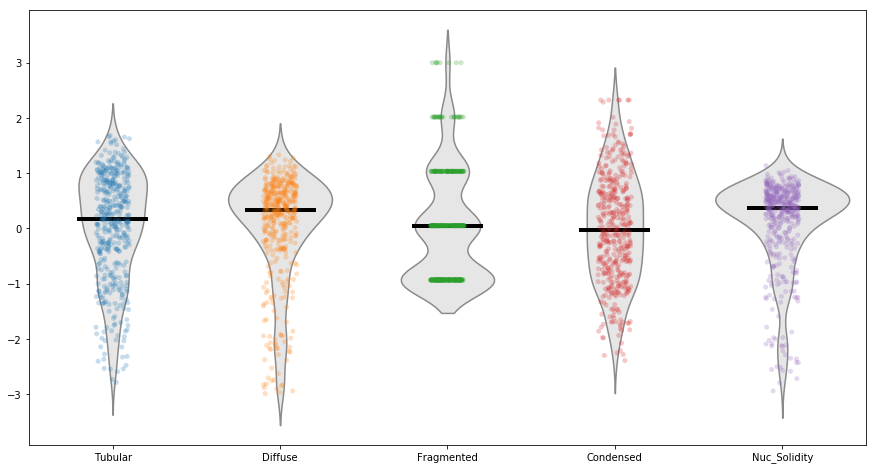

In [19]:
import pylab as Plot
import pandas as pd
import matplotlib.patches as mpatches
import seaborn as sns
from validation_pipeline import nlcmap

def strip_plot_features(iXz, iXz_control,isize=20,columns=["Tubular","Diffuse","Fragmented","Condensed","Nuc_Solidity"],tags=['Phenotype','Control']):
    # sns.set_style("whitegrid")
    Xz = iXz[columns]   
    if iXz_control is not None:
        Xz_control = iXz_control[columns]
        Xz_control = pd.melt(Xz_control)
        Xz = pd.melt(Xz)
        Xz.loc[:,'Type'] = tags[0]
        Xz_control.loc[:,'Type']=tags[1]
        my_df_t = pd.concat([Xz,Xz_control])  
       
        ax = sns.stripplot(x='variable',y='value',hue='Type',edgecolor='black',linewidth=1,data=my_df_t,palette = ["#e74c3c","#3498db"],dodge=True, jitter=0.25, alpha=0.25, size=isize)
        ax.axes.set_xlim(-1, 5)
        classes = tags
        class_colours =  ["#e74c3c","#3498db"]
        recs = []
        for i in range(0, len(class_colours)):
            recs.append(mpatches.Rectangle((0, 0), 1, 1, fc=class_colours[i]))
        Plot.legend(recs, classes, loc=4)
        return ax
    else:
        ax = sns.stripplot(data=Xz, jitter=True, alpha=0.25, size=isize)
        ax = sns.violinplot(data=Xz, inner = None, color = ".9")
    # sns.despine()
    # distance across the "X" or "Y" stripplot column to span, in this case 40%
    median_width = 0.4

    for tick, text in zip(ax.get_xticks(), ax.get_xticklabels()):
        sample_name = text.get_text()  # "X" or "Y"
        median_val = Xz[sample_name].median()
        # plot horizontal lines across the column, centered on the tick
        ax.plot([tick - median_width / 2, tick + median_width / 2], [median_val, median_val],
                lw=4, color='k')

    #Plot.show()
    #Plot.close()
    return ax

def getFeatures(idf_features,gene):
    features_pheno = idf_features.query('Gene==\''+gene+'\'').copy()
    features_pheno = features_pheno[["Tubular","Diffuse","Fragmented","Condensed","Nuc_Solidity"]]
    return features_pheno


features_c = getFeatures(df_features_gene_norm,'UMO')
Plot.rcParams['figure.figsize'] = (15, 8)

fig, ax = plt.subplots() 

ax= strip_plot_features(features_c,None,isize=5,columns=["Tubular","Diffuse","Fragmented","Condensed","Nuc_Solidity"],tags=['UMO'])
Plot.show()


In [20]:
df = df.reset_index(drop=False)
res = df_features_gene_norm.join(df,on='index',rsuffix='_right')
res= res.drop(columns=['index','index_right', 'Gene_right'])
print("Total cells so far:"+str(len(res)))
res.head()

Total cells so far:425


,Tubular,Diffuse,Fragmented,Condensed,Nuc_Solidity,Gene,Metadata_BaseFileName,FileName_ColorImage,Location_Center_X,Location_Center_Y,...,Metadata_Y,ImageQuality_PowerLogLogSlope_Dna,Intensity_IntegratedIntensity_GolgiBGCorr,Mean_Nuclei_Math_CV,Math_Blobness,Math_Diffuseness,Children_Golgi_Count,Mean_MaxAreaGolgi_AreaShape_FormFactor,img_name,img_name_raw
0,0.833651,0.282117,0.051130,0.502192,0.648751,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,625.973978,343.800743,...,1,-2.077484,293.550841,0.238129,0.847078,0.692007,2,0.686566,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
1,0.957637,0.315918,0.051130,-0.581013,0.532113,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,33.200577,125.072413,...,2,-1.700897,149.563642,0.411079,0.859343,0.697376,2,0.484985,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
2,0.168220,0.379587,2.016307,0.429532,0.598157,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,63.408124,213.611495,...,2,-1.700897,249.222059,0.538432,0.781248,0.707491,4,0.673044,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
3,-1.232409,0.585165,0.051130,0.212142,0.602712,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,424.276363,318.223383,...,2,-1.700897,185.264183,0.194579,0.642687,0.740149,2,0.632589,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
4,0.149569,0.082548,-0.931458,-0.229549,-0.224378,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,373.185519,373.946368,...,2,-1.700897,161.778848,0.175633,0.779403,0.660304,1,0.550391,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...


In [21]:
# Initialization parameters
cells_random = 200 # how many cells to pick randomly in the plot in the button add random
indexes = set()
cell_final_indexes = set()
feature ='Diffuse'

In [22]:
from validation_pipeline import plotQC
import os
%gui qt


mp, selection_stream = plotQC(res,feature,"diffusion",size=5,jitter =0.4, factor_reduce=0.8)

def openVisor(bval):
    images_list = [ res.at[res.index[i],'img_name_raw'] for i in selection_stream.index]
    images_values = [ str(res.at[res.index[i],feature]) for i in selection_stream.index]
    if len(images_list)>0:
            %run -i visorOk.py --listImages $images_list --folder $dfolder --listIndex $selection_stream.index --listValues $images_values
            
def save_ind(bval):
    for el in selection_stream.index:
        indexes.add(el)
    print("Indices saved : "+str(indexes))
    return

def save_ind_randomly(bval):
    cells_range = np.min([len(selection_stream.index),cells_random])
    for el in range(cells_range): 
        index_random = random.choice(selection_stream.index)
        indexes.add(index_random)
    print("Indices saved :"+str(indexes))
    return
    
def clear_indexes(bval):
    indexes = set()
    print("All selections cleared.")
    return

b = widgets.Button(
    description='Save indexes',
    disabled=False,
    tooltip='Selection is saved',
)

b2 = widgets.Button(
    description='Show selected',
    disabled=False,
    tooltip='Show in viewer',
)

b3 = widgets.Button(description='Add random',
                    disabled=False, tooltip='Add randomly '+str(cells_random)+' cells from selected region')

b4 = widgets.Button(description='Clear all indexes',
    disabled=False,tooltip='Clear all selections')

b.on_click(save_ind)
b2.on_click(openVisor)
b3.on_click(save_ind_randomly)
b4.on_click(clear_indexes)

display(widgets.HBox([b, b2, b3, b4]))
mp

:Layout
   .Scatter.I    :Scatter   [Gene]   (Diffuse)
   .DynamicMap.I :DynamicMap   []
      :Div

Indices saved : {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 46, 47, 49, 50, 51, 56, 57, 58, 60, 62, 63, 64, 65, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 137, 138, 139, 140, 142, 144, 145, 146, 148, 149, 150, 151, 152, 153, 154, 156, 157, 158, 159, 160, 161, 162, 164, 165, 166, 167, 168, 169, 170, 171, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 184, 185, 187, 188, 189, 191, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 222, 225, 226, 228, 229, 230, 231, 232, 235, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 248, 249, 250, 251, 252, 253, 254, 257, 258, 260, 262, 264,

In [23]:
indexes

{0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 18,
 19,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 46,
 47,
 49,
 50,
 51,
 56,
 57,
 58,
 60,
 62,
 63,
 64,
 65,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 116,
 117,
 118,
 119,
 120,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 137,
 138,
 139,
 140,
 142,
 144,
 145,
 146,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 184,
 185,
 187,
 188,
 189,
 191,
 193,
 194,
 195,
 196,
 197,
 198,
 199,
 200,
 201,
 202,
 203,
 204,
 205,
 206,
 207,
 208,
 209,
 210,
 211,
 212,
 213,
 214,
 215,
 216,
 217,

In [24]:
cell_final_indexes.update(indexes)

# PART 3 (Optional): Select cells based on tSNE clustering     

In [ ]:
import os
%gui qt
from validation_pipeline import plotNselect_tSNE
# change perplexity between 30 and 80 to see different cluster distribution
mp, selection_stream = plotNselect_tSNE(res,features=["Tubular","Diffuse","Fragmented","Condensed"], size=4, perplexity = 50)

def openVisor(bval):
    images_list = [ res.at[df.index[i],'img_name_raw'] for i in selection_stream.index]
    images_values = [ str(res.at[res.index[i],feature]) for i in selection_stream.index]
    if len(images_list)>0:
                %run -i visorOk.py --listImages $images_list --folder $dfolder --listIndex $selection_stream.index --listValues $images_values
def save_ind(bval):
    for el in selection_stream.index:
        indexes.add(el)
    print("Indices saved : "+str(indexes))
    return

def save_ind_randomly(bval):
    cells_range = np.min([len(selection_stream.index),cells_random])
    for el in range(cells_range): 
        index_random = random.choice(selection_stream.index)
        indexes.add(index_random)
        print("Indices saved :"+str(indexes))
        return
    
def clear_indexes(bval):
    indexes = set()
    print("All selections cleared.")
    return

b = widgets.Button(
    description='Save indexes',
    disabled=False,
    tooltip='Selection is saved',
)

b2 = widgets.Button(
    description='Show selected',
    disabled=False,
    tooltip='Show in viewer',
)

b3 = widgets.Button(description='Add random',
                    disabled=False, tooltip='Add randomly '+str(cells_random)+' cells from selected region')

b4 = widgets.Button(description='Clear all indexes',
    disabled=False,tooltip='Clear all selections')

b.on_click(save_ind)
b2.on_click(openVisor)
b3.on_click(save_ind_randomly)
b4.on_click(clear_indexes)

display(widgets.HBox([b, b2, b3, b4]))
mp



In [ ]:
cell_final_indexes.update(indexes)

In [ ]:
cell_final_indexes

# PART 4:  Select the number of cells per treatment



## Select cells of interest

In [25]:
inds = list(cell_final_indexes)
final_stage = res.loc[inds,:]

In [26]:
from scipy.spatial import KDTree

def listOfClosest(list_sem, radius = 200):
        """
         Gives back the indices of elements to be removed

        Notice that this method requires some sophistication.
        In this approach we just leave the first element we find.
        :param m_list_px:
        :param m_list_py:
        :param radius:
        :return:
        """
        cp_list = list_sem.copy()
        # for the tree
        ncp_list = list_sem.copy()
        ncp_list_x = list(ncp_list['Location_Center_X'])
        ncp_list_y = list(ncp_list['Location_Center_Y'])
        tree_list = list(zip(ncp_list_x, ncp_list_y))
        list_excluded = []
        for mindex,row in cp_list.iterrows():
            el = np.array((row['Location_Center_X'],row['Location_Center_Y']),dtype=np.float32)
            distances_p, indexes =  KDTree(tree_list).query(el,k=2) # closest element that is not yourself
            if( distances_p[1] < radius):
                list_excluded.append(mindex)
                ncp_list = ncp_list.drop(df.index[[mindex]])
                ncp_list_x = ncp_list['Location_Center_X']
                ncp_list_y = ncp_list['Location_Center_Y']
                tree_list = list(zip(ncp_list_x, ncp_list_y))
                if(len(tree_list)<2):
                    break

        return list_excluded

In [27]:
df_points = final_stage[['Location_Center_X','Location_Center_Y']]
list_ex = listOfClosest(df_points)

In [28]:
from ipywidgets import Button, HBox, VBox, ToggleButton, Layout
def show_selected_cells_excluded(mindexes):
    sel_cells = 3
    items = []
    items2 = []
    boxes = []
    i = 1
    real_indexes = []
    for index in range(len(final_stage)): 
        real_ind = final_stage.index[index]
        real_indexes.append(real_ind)
    real_indexes.sort()    
    
    for real_ind in real_indexes:
        name = final_stage.at[real_ind,'Gene']
        file = open(final_stage.at[real_ind,'img_name_raw'], "rb")
        image = file.read() 
        if real_ind in mindexes:
            items.append(ToggleButton(value = False, button_style='warning',icon='check', description=str(name+"_"+str(real_ind)), tooltip=str(name),layout=Layout(width='300px', height='50px')))
        else:
            items.append(ToggleButton(value = True, button_style='success',icon='check', description=str(name+"_"+str(real_ind)), tooltip=str(name),layout=Layout(width='300px', height='50px')))
        items2.append(widgets.Image(value=image,format='png',layout=Layout(width='300px', height='300px')))
        if i%sel_cells == 0:
            boxes.append(VBox([HBox(items),HBox(items2)]))
            items = []
            items2 =[]
            i = 0
        i = i+1

    return display(VBox(boxes)), boxes

In [29]:
d, boxes = show_selected_cells_excluded(list_ex)
d

In [30]:
def save_selected_cells(boxes):
    print("You selected: ")
    to_save = {}
    for vb in boxes:
        for bSel in vb.children:
            for m_button in bSel.children :
                if m_button.value == True :
                    value = m_button.description
                    data= value.split('_')
                    treatment = data[0]
                    index = int(data[1])
                    if treatment not in to_save.keys():
                        to_save[treatment] = []
                    print(treatment+" "+str(index))
                    to_save[treatment].append(index)
    return to_save

In [31]:
final_saving  = save_selected_cells(boxes)

You selected: 
UMO 0
UMO 4
UMO 14
UMO 15
UMO 26
UMO 30
UMO 43
UMO 47
UMO 51
UMO 69
UMO 71
UMO 74
UMO 83
UMO 86
UMO 89
UMO 99
UMO 105
UMO 113
UMO 123
UMO 127
UMO 140
UMO 145
UMO 150
UMO 152
UMO 158
UMO 161
UMO 166
UMO 170
UMO 174
UMO 176
UMO 184
UMO 189
UMO 193
UMO 203
UMO 205
UMO 209
UMO 211
UMO 216
UMO 222
UMO 232
UMO 239
UMO 252
UMO 266
UMO 279
UMO 289
UMO 290
UMO 300
UMO 306
UMO 318
UMO 326
UMO 331
UMO 354
UMO 357
UMO 360
UMO 361
UMO 365
UMO 366
UMO 371
UMO 374
UMO 379
UMO 381
UMO 383
UMO 398
UMO 399
UMO 400
UMO 401
UMO 403
UMO 411
UMO 421
UMO 423
UMO 424


In [32]:
ind_m  = final_saving['UMO']
final_stage = res.loc[ind_m,:]


### Show images and discard non wanted

In [33]:
final = final_stage
print(len(final))
final.head()

71


,Tubular,Diffuse,Fragmented,Condensed,Nuc_Solidity,Gene,Metadata_BaseFileName,FileName_ColorImage,Location_Center_X,Location_Center_Y,...,Metadata_Y,ImageQuality_PowerLogLogSlope_Dna,Intensity_IntegratedIntensity_GolgiBGCorr,Mean_Nuclei_Math_CV,Math_Blobness,Math_Diffuseness,Children_Golgi_Count,Mean_MaxAreaGolgi_AreaShape_FormFactor,img_name,img_name_raw
0,0.833651,0.282117,0.051130,0.502192,0.648751,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,625.973978,343.800743,...,1,-2.077484,293.550841,0.238129,0.847078,0.692007,2,0.686566,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
4,0.149569,0.082548,-0.931458,-0.229549,-0.224378,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,373.185519,373.946368,...,2,-1.700897,161.778848,0.175633,0.779403,0.660304,1,0.550391,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
14,0.901282,0.428835,-0.931458,1.935096,0.511943,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,425.434887,651.726498,...,2,-1.700897,150.599072,0.223421,0.853768,0.715314,1,0.953226,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
15,-2.144111,0.405324,-0.931458,-2.073429,0.578789,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,459.143742,110.643956,...,3,-1.642844,250.308068,0.239626,0.552495,0.711579,1,0.207251,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
26,0.498592,-0.316067,0.051130,0.181261,-0.555108,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,408.474544,387.109510,...,7,-2.061055,139.722002,0.277652,0.813931,0.596980,2,0.626842,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...


In [34]:
from ipywidgets import Button, HBox, VBox, ToggleButton, Layout
sel_cells = 2
list_cells_ind = []
def on_button_clicked(b):
    print("You selected the gene: "+b.description)
    list_genes.append(b.description)

if len(final)<sel_cells:
    sel_cells = len(final)
items = []
items2 = []
boxes = []
i = 1
for index, row in final.iterrows():       
        label = widgets.Label(value=str(row['Gene']))
        file = open(row["img_name_raw"], "rb")
        image = file.read()
        items.append(ToggleButton(value = True, icon='check', description=str(index), tooltip=(row['Gene']),layout=Layout(width='300px', height='50px')))
        items2.append(widgets.Image(value=image,format='png',layout=Layout(width='300px', height='300px')))
        if i%sel_cells == 0:
            boxes.append(VBox([label,HBox(items),HBox(items2)]))
            items = []
            items2 =[]
            i = 0
        i = i+1

display(VBox(boxes))

### Select cells of interest

In [35]:
print("You selected: ")
to_del = {}
for vb in boxes:
    for ind,b2 in enumerate(vb.children):
        if ind == 0 :
            treatment = b2.value
            if treatment not in to_del.keys():
                to_del[treatment] = []
        if ind == 1 :
            for m_button in b2.children :
                if m_button.value == True :
                    print(treatment+" "+m_button.description)
                    to_del[treatment].append(int(m_button.description))
print('Total of :'+str(len(to_del['UMO'])))

You selected: 
UMO 4
UMO 14
UMO 15
UMO 26
UMO 30
UMO 43
UMO 47
UMO 51
UMO 69
UMO 71
UMO 74
UMO 83
UMO 86
UMO 89
UMO 99
UMO 105
UMO 113
UMO 123
UMO 127
UMO 140
UMO 145
UMO 150
UMO 152
UMO 158
UMO 170
UMO 174
UMO 176
UMO 189
UMO 193
UMO 203
UMO 205
UMO 209
UMO 216
UMO 232
UMO 239
UMO 252
UMO 266
UMO 279
UMO 289
UMO 290
UMO 300
UMO 306
UMO 318
UMO 326
UMO 331
UMO 357
UMO 360
UMO 361
UMO 366
UMO 371
UMO 374
UMO 379
UMO 381
UMO 383
UMO 398
UMO 400
UMO 401
UMO 403
UMO 411
UMO 421
Total of :60


In [36]:
ind_m  = to_del['UMO']
final_stage = res.loc[ind_m,:]

In [37]:
def show_images(df):
    # For this we have to provide the folder where the data of the prescan is. 
    data_folder = os.getcwd()
    images_dir = data_folder 
    df = df.reset_index(drop=True)
    total = int(len(df)/2)+1
    fig = plt.figure(figsize=(30,total*10))       
    k = 0
    for i in range(len(df)):
        mfile = images_dir+'\\'+df.at[i,"img_name_raw"]
        img = cv2.imread(mfile)
        b,g,r = cv2.split(img)       # get b,g,r
        rgb_img = cv2.merge([r,g,b])
        _,tail = os.path.split(mfile)
        cv2.imwrite(".\\cells\\"+tail,rgb_img)
        if img is not None:           
                ax = fig.add_subplot(total, 2, k + 1, xticks=[], yticks=[])
                ax.imshow(np.squeeze(rgb_img))
                k = k+1


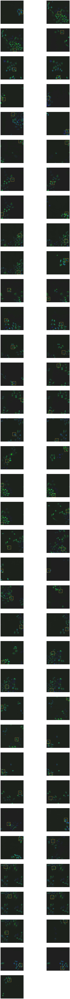

In [39]:
show_images(final)

In [38]:
len(final_stage)

60

In [ ]:
df.at[i,"img_name_raw"]

# PART 5 : Save file

In [40]:
from IPython.core.display import HTML

display(HTML(final.to_html()))
#hv.Div(final.to_html())

,Tubular,Diffuse,Fragmented,Condensed,Nuc_Solidity,Gene,Metadata_BaseFileName,FileName_ColorImage,Location_Center_X,Location_Center_Y,Mean_Golgi_AreaShape_Center_X,Mean_Golgi_AreaShape_Center_Y,Mean_Nuclei_AreaShape_Solidity,Metadata_U,Metadata_V,Metadata_X,Metadata_Y,ImageQuality_PowerLogLogSlope_Dna,Intensity_IntegratedIntensity_GolgiBGCorr,Mean_Nuclei_Math_CV,Math_Blobness,Math_Diffuseness,Children_Golgi_Count,Mean_MaxAreaGolgi_AreaShape_FormFactor,img_name,img_name_raw
0,0.833651,0.282117,0.051130,0.502192,0.648751,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,625.973978,343.800743,620.000000,338.500000,0.960759,0,0,0,1,-2.077484,293.550841,0.238129,0.847078,0.692007,2,0.686566,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
4,0.149569,0.082548,-0.931458,-0.229549,-0.224378,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,373.185519,373.946368,359.000000,395.000000,0.935252,0,0,0,2,-1.700897,161.778848,0.175633,0.779403,0.660304,1,0.550391,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
14,0.901282,0.428835,-0.931458,1.935096,0.511943,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,425.434887,651.726498,441.000000,665.000000,0.956763,0,0,0,2,-1.700897,150.599072,0.223421,0.853768,0.715314,1,0.953226,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
15,-2.144111,0.405324,-0.931458,-2.073429,0.578789,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,459.143742,110.643956,450.000000,120.000000,0.958716,0,0,0,3,-1.642844,250.308068,0.239626,0.552495,0.711579,1,0.207251,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
26,0.498592,-0.316067,0.051130,0.181261,-0.555108,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,408.474544,387.109510,410.000000,385.500000,0.925590,0,0,0,7,-2.061055,139.722002,0.277652,0.813931,0.596980,2,0.626842,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
30,-1.905692,0.922718,-0.931458,-1.142289,0.750293,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,355.742857,616.907834,350.000000,609.000000,0.963726,0,0,0,7,-2.061055,311.138637,0.386595,0.576081,0.793772,1,0.380533,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
43,0.401702,0.097929,-0.931458,-0.818928,0.805869,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,92.443079,443.525022,65.000000,444.000000,0.965350,0,0,0,16,-1.287887,201.938310,0.289780,0.804346,0.662747,1,0.440710,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
47,0.482895,0.148244,-0.931458,-0.253187,0.575276,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,44.617209,413.509377,24.000000,420.000000,0.958613,0,0,0,17,-1.749425,146.082806,0.196410,0.812378,0.670740,1,0.545992,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
51,0.245304,0.476699,-0.931458,-0.730611,0.698854,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,366.237065,71.647908,393.000000,94.000000,0.962223,0,0,0,20,-1.842885,197.122757,0.249247,0.788874,0.722918,1,0.457145,Z:\lleti\AUTOCLEM\05042019_NOSPOTS_COPB1\crops...,./crops/image--L0000--S00--U00--V00--J07--E00-...
69,0.917338,0.182983,-0.931458,-0.574657,-1.268049,UMO,image--L0000--S00--U00--V00--J07--E00--O01--X0...,image--L0000--S00--U00--V00--J07--E00--O01--X0...,617.37

In [41]:
final_stage.to_csv('selected_cells.csv')

In [42]:
os.getcwd()

'Z:\\lleti\\AUTOCLEM\\05042019_NOSPOTS_COPB1'

#### Save in folder
Remember to save as .html or PDF/Latex.

# END